In [1]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

from tqdm import tqdm

import hrv_analysis as hrv
import optical_gating_analysis as OG

import j_py_sad_correlation as jps

import tifffile as tf
import glob

In [2]:
data_src = r"C:\Users\Karlin\Documents\PhD\Data\April 2024 Imaging\2024-04-26 17.30.44 vid bloodless 200fps\Allied Vision Technologies GS650 0001f61c\*tif"

In [3]:
oog = OG.BasicOpticalGating()
oog.sequence_manager.set_source(data_src)
oog.run()

Setting source to C:\Users\Karlin\Documents\PhD\Data\April 2024 Imaging\2024-04-26 17.30.44 vid bloodless 200fps\Allied Vision Technologies GS650 0001f61c\*tif
Getting reference sequence Reference period: 73.62612008708606; Reference indices: [33, 111]


Getting SADs: 100%|██████████| 31/31 [01:49<00:00,  3.54s/it]


Getting phases


In [7]:
data = OG.SequenceManager.load_tif(data_src)
data_sorted = data[np.argsort(oog.phases)]

In [47]:
data_sorted_stabilised = tf.imread(r"C:\Users\Karlin\Documents\PhD\Python\optical_gating_analysis\analysis\rough\2024_07\sorted_stabilised.tif").astype(np.int32)

In [46]:
tf.imwrite("sorted.tif", data_sorted)

KeyboardInterrupt: 

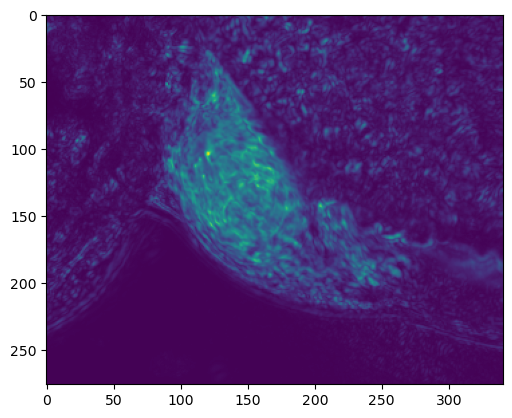

In [43]:
plt.imshow(np.std(data_sorted_stabilised, axis=0))
plt.show()

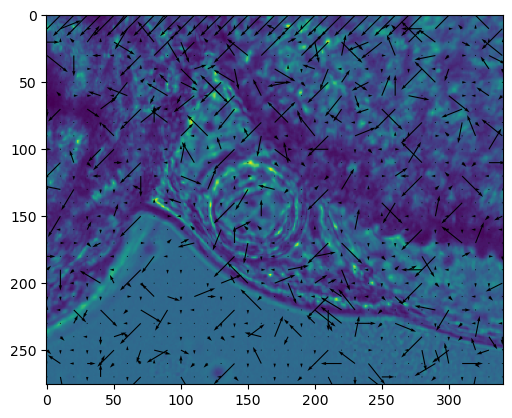

In [193]:
import scipy

# Use PIV to plot a vector field using cross correlation between frames data_sorted_stabilised[0] and data_sorted_stabilised[1]
# First define our coordinates across frame 1
x = np.arange(0, data_sorted_stabilised[0].shape[1], 10)
y = np.arange(0, data_sorted_stabilised[0].shape[0], 10)
X, Y = np.meshgrid(x, y)

# No iterate through each region and find the cross correlation in the local area
# This will be our displacement vector
displacement = np.zeros((x.shape[0], y.shape[0], 2))

for i, _x in enumerate(x):
    for j, _y in enumerate(y):
        frame1_normalised = data_sorted_stabilised[0][_y-10:_y+10,_x-10:_x+10] - np.mean(data_sorted_stabilised[0][_y-10:_y+10,_x-10:_x+10])
        frame2_normalised = data_sorted_stabilised[1][_y-5:_y+5,_x-5:_x+5] - np.mean(data_sorted_stabilised[1][_y-5:_y+5,_x-5:_x+5])
        cross_correlation = scipy.signal.correlate2d(frame1_normalised, frame2_normalised, mode = "valid")
        displacement[i,j] = np.unravel_index(np.argmax(cross_correlation), cross_correlation.shape) - np.array([5,5])

# Plot the vector field
plt.imshow(data_sorted_stabilised[0])
plt.quiver(X, Y, displacement[:,:,0], displacement[:,:,1])
plt.show()


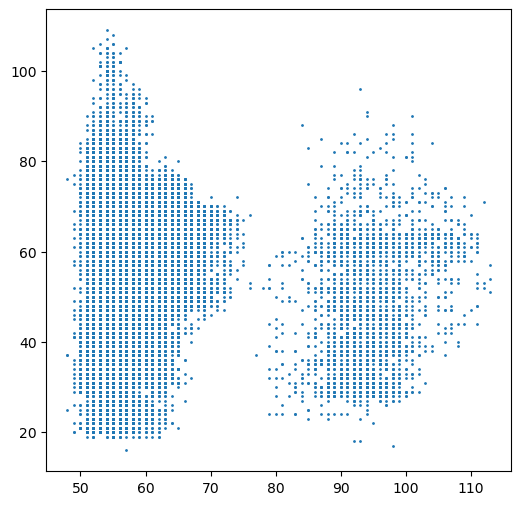

In [97]:
x = 150
y = 100
points1 = []
points2 = []
for i in range(oog.phases.shape[0]):
    points1.append(data[i,x-oog.drifts[i][0],y-oog.drifts[i][1]])
    points2.append(data[i+1,x-oog.drifts[i+1][0]+1,y-oog.drifts[i+1][1] + 10])

plt.figure(figsize = (6,6))
plt.scatter(points1, points2, s = 1)



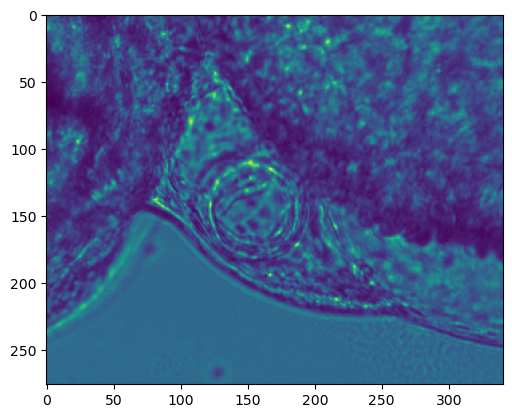

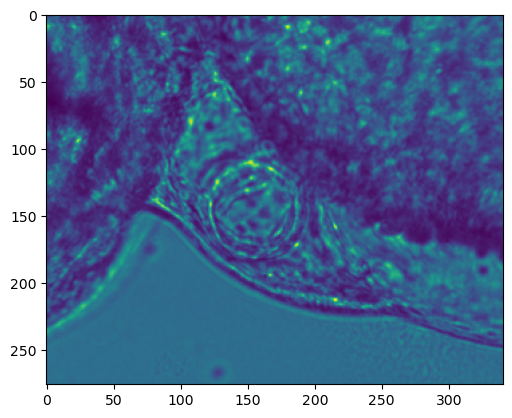

In [15]:
plt.imshow(data_sorted_stabilised[0])
plt.show()
plt.imshow(data_sorted_stabilised[1])
plt.show()

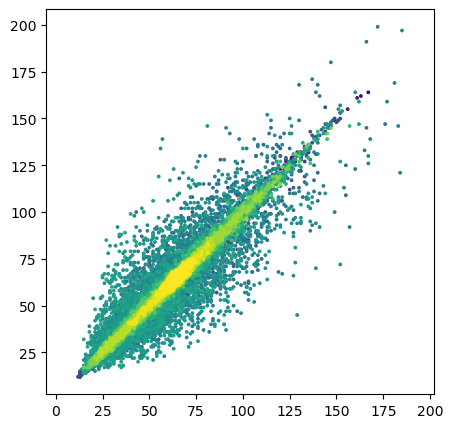

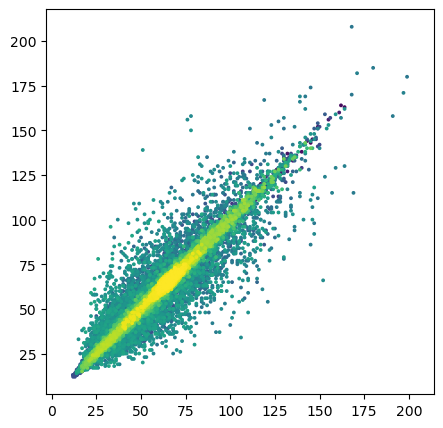

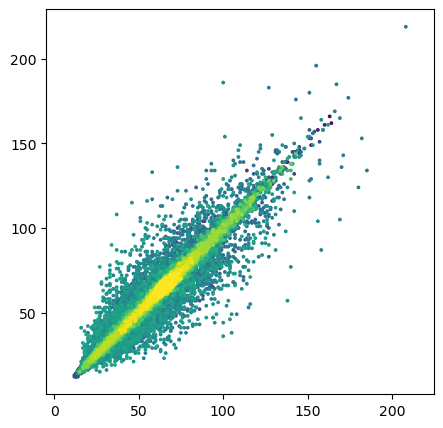

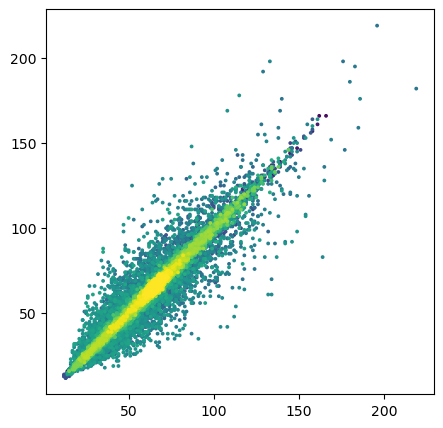

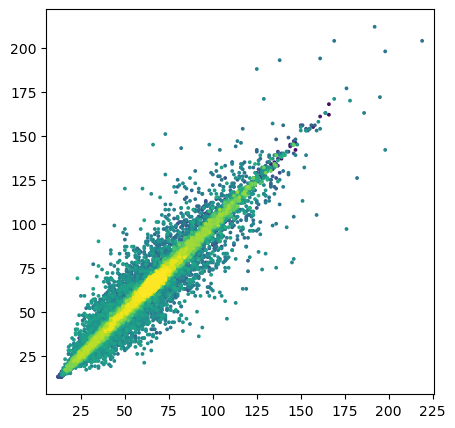

...

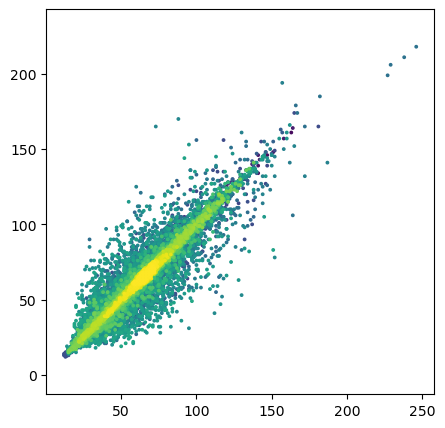

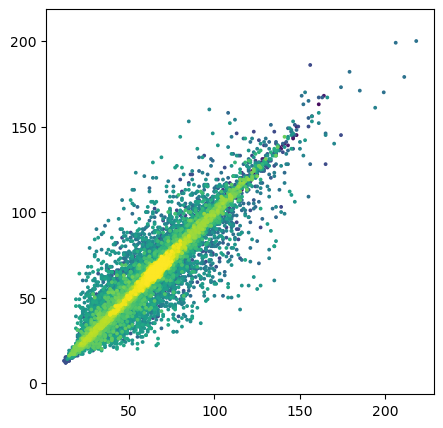

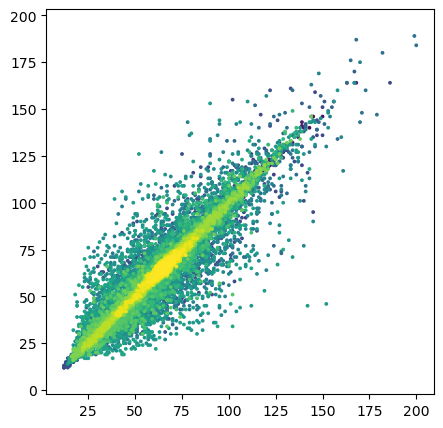

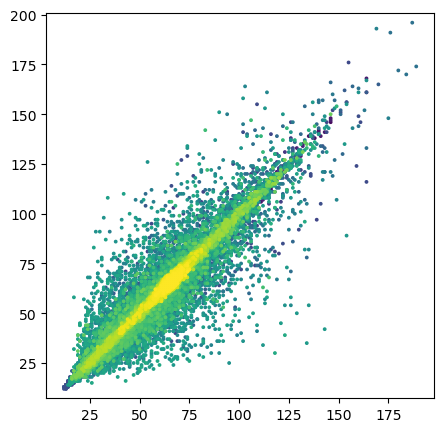

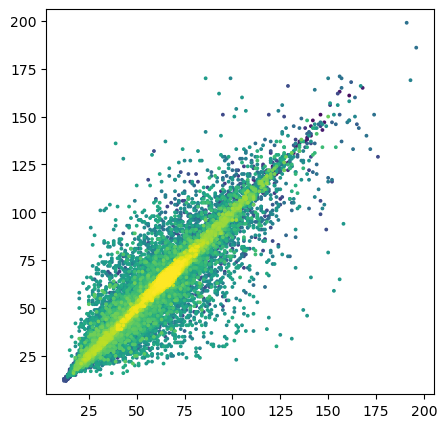

In [19]:
frame = 1
for frame in range(100):
    plt.figure(figsize = (5,5))
    plt.scatter(data[frame].flatten(), data[frame+1].flatten(), s = 3, c = range(len(data[0].flatten())), cmap = "viridis")
    plt.axis("equal")
    plt.show()